# Segmentation of e-shop customers 

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

from sklearn.model_selection import ParameterGrid
from sklearn.metrics import silhouette_samples, silhouette_score
import matplotlib.cm as cm
from yellowbrick.cluster import SilhouetteVisualizer

from sklearn.preprocessing import MinMaxScaler


In [2]:
df = pd.read_csv("eshop.csv")

In [3]:
df.head()
# df.info()


,Customer ID,Date,Subtotal,Country
0,34,6/21/2007,86.0,Czech Republic
1,38,6/27/2007,38.4,Czech Republic
2,47,7/2/2007,53.5,Slovakia
3,61,7/14/2007,7.0,Czech Republic
4,78,7/21/2007,55.5,Czech Republic


## Pokyny k vypracování

**Základní body zadání**, za jejichž (poctivé) vypracování získáte **8 bodů**:
- Vytvořte `rfm` data frame, kde každý řádek odpovídá jednomu zákazníkovi a sloupce (příznaky) jsou uvedené výše.
- Pomocí algoritmu `K-means` proveďte shlukování. Nějakým způsobem také odhadněte nejlepší počet shluků (podrobně vysvětlete).
- Zabývejte se vlivem přeškálování dat (standardizace příznaků). Tj. určete, zda je přeškálování vhodné, a proveďte ho.
- Interpretujte jednotlivé shluky. Použijte získané shluky k odlišení "superstar" zákazníků (vysoká monetary, vysoká frequency a nízká recency) od nezajímavých  zákazníků (vysoká recency, nízká frequency, nízká monetary).

**Další body zadání** za případné další body  (můžete si vybrat, maximum bodů za úkol je každopádně 12 bodů):
- (až +4 body) Proveďte analýzu vytvořených shluků pomocí metody silhouette (https://en.wikipedia.org/wiki/Silhouette_(clustering)).
- (až +4 body) Zkuste provést to samé s modifikovanou verzí **RFM**, kde Recency = "maximum počtu měsíců od posledního nákupu a čísla 1", Frequency = "maximum počtu nákupů daného zákazníka v posledních 12 měsících a čísla 1", Monetary = "Nejvyšší hodnota nákupu daného zákazníka". Porovnejte s původním přístupem.

## Poznámky k odevzdání

  * Řiďte se pokyny ze stránky https://courses.fit.cvut.cz/BI-VZD/homeworks/index.html.
  * Odevzdejte Jupyter Notebook.
  * Ke komentování toho, co v notebooku děláte, použijte Markdown buňky.
  * Opravující Vám může umožnit úkol dodělat či opravit a získat tak další body. První verze je ale důležitá a bude-li odbytá, budete za to penalizováni


In [4]:
# vytvor rfm

recency = df[['Customer ID','Date']].groupby(by=['Customer ID']).max().rename(columns={'Date':'Recency'})
recency['Recency'] = (pd.to_datetime('12-19-2015') - pd.to_datetime(recency['Recency'])).dt.days
# display(recency)

frequency = df[['Customer ID','Date']].groupby(by=['Customer ID']).count().rename(columns={'Date':'Frequency'})
# display(frequency)

monetary = df[['Customer ID','Subtotal']].groupby(by=['Customer ID']).sum().rename(columns={'Subtotal':'Monetary'})
# display(monetary)

rfm = recency.join([frequency,monetary])
display(rfm)

X = rfm.to_numpy()
X_cpy = rfm.to_numpy()
print(X.shape)

,Recency,Frequency,Monetary
Customer ID,,,
7,1011,3,15.54
9,3050,1,13.20
30,3025,1,36.20
34,3103,1,86.00
38,3097,1,38.40
...,...,...,...
15356,1,1,31.87
15357,1,1,6.10
15358,1,1,153.23


(12829, 3)


Vytvoříme slukovaná data pomocí algoritmu k-Means

1. optimalizaci a volbu k nejprve jednoduše odhadneme na základě vykresleného grafu -> najdeme loket

2. optimalizaci provedeme pomocí metody silhouette analysis

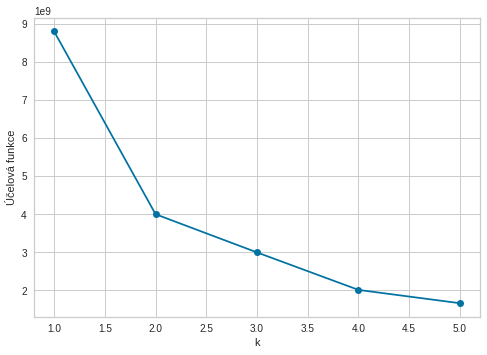

In [5]:
# 1. k-means, odhad k
from sklearn.cluster import KMeans

ix = np.zeros(5)
iy = np.zeros(5)
for k in range(5):
    kmeans = KMeans(n_clusters=k+1, random_state = 1, n_init=2).fit(X.copy())
    iy[k] = kmeans.inertia_
    ix[k] = k+1

plt.xlabel('k')
plt.ylabel('Účelová funkce')
plt.plot(ix, iy, 'o-')
plt.show()

[0 1 1 ... 0 0 0]
[[5.96768985e+02 1.86761711e+00 1.86436971e+02]
 [1.82101310e+03 1.60705290e+00 1.20449347e+02]]


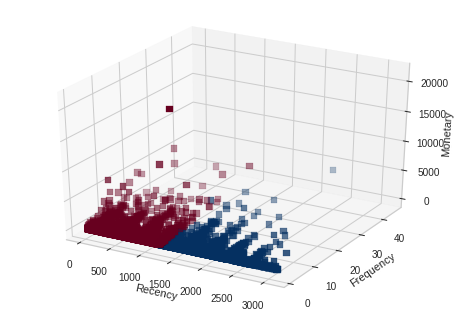

In [6]:
#   podle odhadu volím k=2
X_c = X.copy()
k = 2
kmeans = KMeans(n_clusters = k).fit(X_c)

#   výsledné shluky
print(kmeans.labels_)
#   a jejich středy
print(kmeans.cluster_centers_)

#   vizualizace

def show_2d_silhouette(x,y):
    fig = plt.figure()
    ax = fig.add_subplot(111)
    ax.set_xlabel('x')
    ax.set_ylabel('y')
    ax.scatter(x,y)

    plt.show()

def visualisation_3d_data(data,labels):
    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')
    x = np.array(data[:,0])
    y = np.array(data[:,1])
    z = np.array(data[:,2])

    ax.set_xlabel('Recency')
    ax.set_ylabel('Frequency')
    ax.set_zlabel('Monetary')
    ax.scatter(x,y,z, marker="s", c=labels, s=40, cmap="RdBu")

    plt.show()

visualisation_3d_data(X_c,kmeans.labels_)

"silhouette analýza", její základní proces je převzat z https://scikit-learn.org/stable/auto_examples/cluster/plot_kmeans_silhouette_analysis.html. Vizualizaci jsem pak vytvořila pomocí knihovny Yellowbrick z https://www.scikit-yb.org/en/latest/api/cluster/silhouette.html

score for 2 clusters is:  0.5464324796084292
score for 3 clusters is:  0.4869969593047542
score for 4 clusters is:  0.5001362145371232
score for 5 clusters is:  0.5137039310469299
score for 6 clusters is:  0.47680492302062727


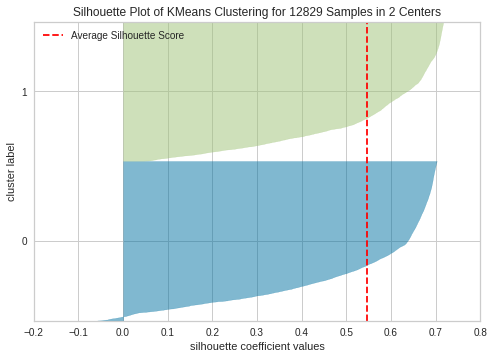

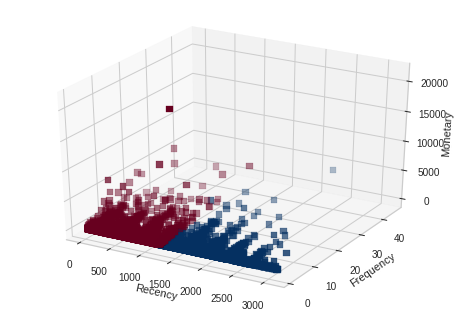

NameError: name 'cluster_labels' is not defined

In [7]:
# silhouette analysis
def silhouette(data):
    param_grid = {
        "n_clusters": [2, 3, 4, 5, 6]
    }
    param_comb = ParameterGrid(param_grid)
    val_acc = 0
    for params in param_comb:
        clusterer = KMeans(**params, random_state=10)
        cluster_labels = clusterer.fit_predict(data)
        score = silhouette_score(data, cluster_labels)
        print("score for",params["n_clusters"],"clusters is: ",score)
        if val_acc < score:
            opt_params_kmeans = params
            val_acc = score
    return opt_params_kmeans

def visualisation_silhouette(model,data):
    visualizer = SilhouetteVisualizer(model, colors='yellowbrick')

    visualizer.fit(data)        # Fit the data to the visualizer
    visualizer.show()        # Finalize and render the figure

X_s = X.copy()
opt_params_kmeans = silhouette(X_s)
kmeans = KMeans(**opt_params_kmeans, random_state=10)
visualisation_silhouette(kmeans,X_s)
visualisation_3d_data(X_s,kmeans.labels_)
score = silhouette_score(X_s, cluster_labels)
print("silhouette score: "+str(score))

Obě metody volí jako optimalni množství clusterů cislo 2, Data jsou ale dost neucelena, zkusime je trochu upravit.

Nejdříve vyzkoušíme data znormalizovat

In [9]:
from sklearn.preprocessing import MinMaxScaler
def normalization(data):
    scaler = MinMaxScaler()
    scaler.fit(data)
    data = scaler.transform(data)
    return data

scaled_X = normalization(X.copy())
display(scaled_X)

array([[3.25813729e-01, 4.54545455e-02, 6.71304088e-04],
       [9.82919755e-01, 0.00000000e+00, 5.61913310e-04],
       [9.74863036e-01, 0.00000000e+00, 1.63712181e-03],
       ...,
       [3.22268772e-04, 0.00000000e+00, 7.10806313e-03],
       [0.00000000e+00, 0.00000000e+00, 8.40065073e-04],
       [0.00000000e+00, 0.00000000e+00, 6.44751113e-03]])

score for 2 clusters is:  0.5777242832939866
score for 3 clusters is:  0.5316069648237173
score for 4 clusters is:  0.49736858630452163
score for 5 clusters is:  0.488285195976551
score for 6 clusters is:  0.500273822936264


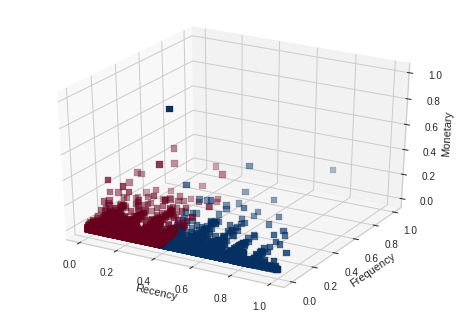

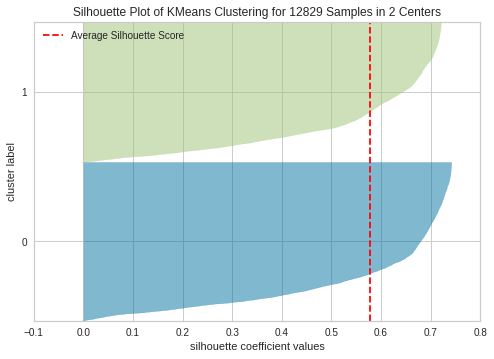

In [10]:
opt_params_kmeans = silhouette(scaled_X)
kmeans = KMeans(**opt_params_kmeans).fit(scaled_X)
visualisation_3d_data(scaled_X,kmeans.labels_)
visualisation_silhouette(kmeans,scaled_X)

Vidíme, že normalizace do rozhasu 0-1 nepomáhá. Zkusíme jiný způsob znázornění dat. Frekvence nákupu je převážně nakupená u nízkých hodnot. Zkusíme tuto část dat roztáhnout pomocí logaritmické funkce.

score for 2 clusters is:  0.5464351317475197
score for 3 clusters is:  0.4870011655129024
score for 4 clusters is:  0.500140494554404
score for 5 clusters is:  0.513708374174492
score for 6 clusters is:  0.47681075885443014


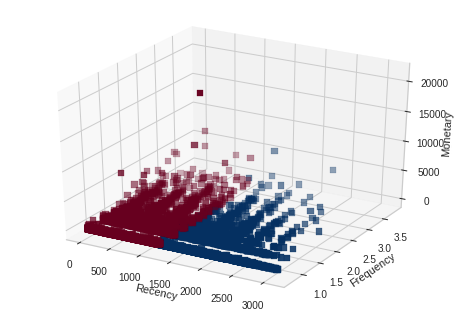

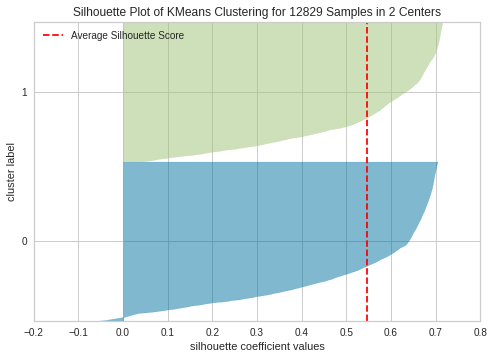

In [11]:
X_l = X.copy()

def logaritmuj(data):
    data[:,1] = np.log(data[:,1]+1)
    # data[:,2] = np.log(data[:,2]+1)
    # data[:,0] = np.log(data[:,0]+1)
    return data

X_l = logaritmuj(X_l)
opt_params_kmeans=silhouette(X_l)
kmeans = KMeans(**opt_params_kmeans).fit(X_l)
visualisation_3d_data(X_l,kmeans.labels_)
visualisation_silhouette(kmeans,X_l)

K poslednímu úkolu data ještě upravíme, odstraníme návštěvníky, kteří byly na eshopu pouze jednou, ti totiŽ "superstar" urcite nebudou. 

In [12]:
no_one_rfm = rfm[rfm["Frequency"] > 1 ]
X_superstar = no_one_rfm.to_numpy()
X_superstar = logaritmuj(X_superstar)
print(X_superstar.shape)
print(X_superstar)

(3646, 3)
[[1.01100000e+03 1.38629436e+00 1.55400000e+01]
 [3.02500000e+03 1.09861229e+00 1.88790000e+02]
 [2.29800000e+03 1.09861229e+00 1.08650000e+02]
 ...
 [1.10000000e+01 1.09861229e+00 2.02300000e+01]
 [4.00000000e+00 1.09861229e+00 1.84930000e+02]
 [7.00000000e+00 1.09861229e+00 2.81400000e+01]]


Hledame zakazniky s nizkou recency, vysokou frequency a vysokou monetary


score for 2 clusters is:  0.48038384170494874
score for 3 clusters is:  0.5085229909400658
score for 4 clusters is:  0.5253111733701766
score for 5 clusters is:  0.445659673043586
score for 6 clusters is:  0.45334091002708


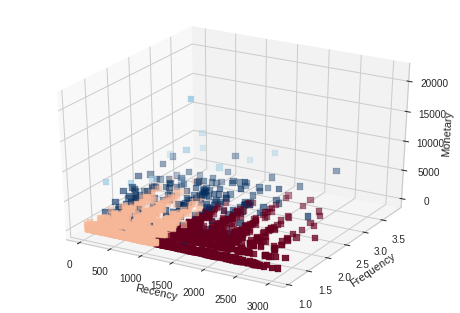

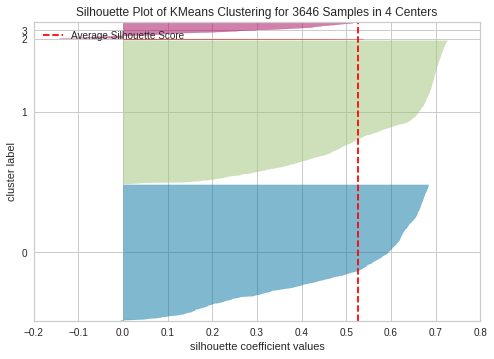

In [13]:
opt_params_kmeans = silhouette(X_superstar)
kmeans = KMeans(**opt_params_kmeans).fit(X_superstar)
visualisation_3d_data(X_superstar,kmeans.labels_)
visualisation_silhouette(kmeans,X_superstar)

Zkusime si znazornit jednotlive clustery

3646
186


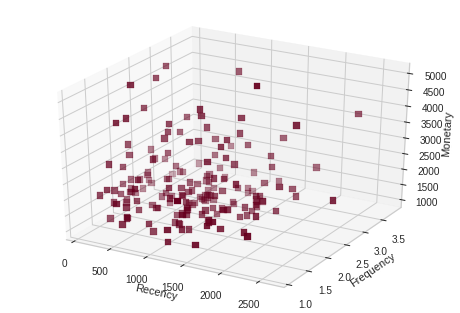

In [19]:
def printCLuster(number,data,labels):
    out_data = []
    for points, n in zip(data,labels):
        if n == number:
            out_data.append(list(points))
    return np.array(out_data)

print(len(X_superstar))
data = printCLuster(3,X_superstar,kmeans.labels_)
print(len(data))
visualisation_3d_data(data,np.zeros((len(data),1)))

cluster cislo 3 vypada asi nejlepe
tedy data jsou vyslednym clusterem, ktery urcuje zakazniky, ktere casto nakupuji. Vidím, ale že se tam přesto vyskytují, nějaká data, která tomu moc neodpovídají.
Vezmu tento cluster a zkusím ho jeste jednou rozdelit

score for 2 clusters is:  0.5560095293654999
score for 3 clusters is:  0.40329096594655334
score for 4 clusters is:  0.3953661746733059
score for 5 clusters is:  0.3816285604049166
score for 6 clusters is:  0.3854130332417553


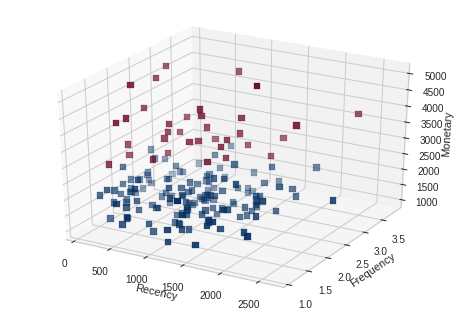

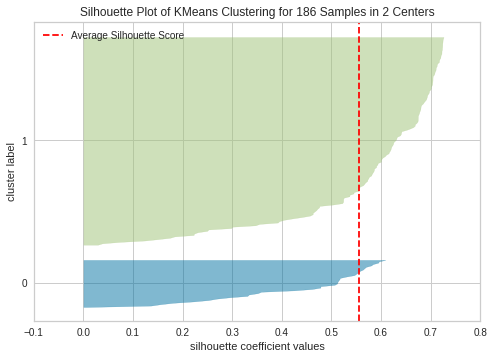

In [24]:
opt_params_kmeans = silhouette(data)
kmeans = KMeans(**opt_params_kmeans).fit(data)
visualisation_3d_data(data,kmeans.labels_)
visualisation_silhouette(kmeans,data)

HA, ted si vezmu ten horní cluster, který nám dá i nejvyšší útratu zákazníků

186
35


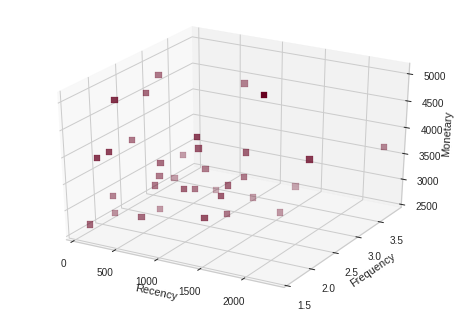

(2, 3)
186
[[1.55000000e+03 2.99573227e+00 2.61437000e+03]
 [2.29300000e+03 3.82864140e+00 3.66914000e+03]
 [1.54200000e+03 2.63905733e+00 5.02096000e+03]
 [8.36000000e+02 3.49650756e+00 4.60518000e+03]
 [8.13000000e+02 2.94443898e+00 2.84571000e+03]
 [1.96400000e+03 2.83321334e+00 3.86301000e+03]
 [4.79000000e+02 2.39789527e+00 3.56244000e+03]
 [8.36000000e+02 2.48490665e+00 3.12566000e+03]
 [1.21400000e+03 2.83321334e+00 3.28461000e+03]
 [1.54100000e+03 3.33220451e+00 2.92700000e+03]
 [1.23100000e+03 2.83321334e+00 3.76782000e+03]
 [8.15000000e+02 2.30258509e+00 3.23022000e+03]
 [8.80000000e+01 2.48490665e+00 3.83624000e+03]
 [1.17700000e+03 2.56494936e+00 3.26558000e+03]
 [1.19300000e+03 2.39789527e+00 3.16761000e+03]
 [1.21300000e+03 2.48490665e+00 2.76806000e+03]
 [1.22900000e+03 2.99573227e+00 2.80450000e+03]
 [1.18400000e+03 2.07944154e+00 2.92335000e+03]
 [9.90000000e+01 2.77258872e+00 4.57568000e+03]
 [4.58000000e+02 2.39789527e+00 2.65686000e+03]
 [8.00000000e+01 3.04452244e+

In [29]:
def printCLuster(number,data,labels):
    out_data = []
    for points, n in zip(data,labels):
        if n == number:
            out_data.append(list(points))
    return np.array(out_data)

print(len(data))
superstar = printCLuster(0,data,kmeans.labels_)
print(len(superstar))
visualisation_3d_data(superstar,np.zeros((len(superstar),1)))

centroids = kmeans.cluster_centers_
labels = kmeans.labels_
print(centroids.shape)
print(len(labels))

# superstar = pd.Series([labels]).groupby([pd.Series([labels])]).count()
print(superstar) 